In [17]:
import histogram as vs # video summarization
import matplotlib.pyplot as plt
import pickle
from sklearn.externals import joblib
%matplotlib inline

# 10 second clip

In [2]:
frames_mini = list(vs.frames_from_file('eric-10s.mp4'))

In [3]:
prev_num_frames = 10
prev_idx = list(vs.it.takewhile(lambda i: i < len(frames_mini), vs.it.count(0, len(frames_mini)/prev_num_frames)))

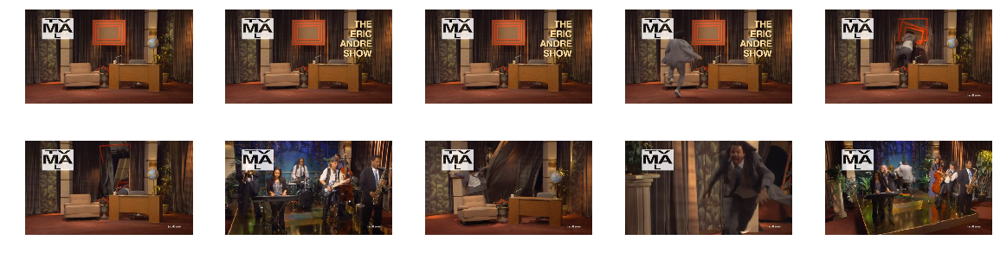

In [4]:
plt.figure(figsize=(20,5))
for i in range(1, 11):
    plt.subplot(2, 5, i)
    plt.axis('off')
    plt.imshow(vs.cv2.cvtColor(frames_mini[prev_idx[i]], vs.cv2.COLOR_BGR2RGB))

In [5]:
A_mini = vs.frames_to_matrix(frames_mini, 5, 3, 3)
V, S, rank = vs.frame_decomp(A_mini)
clusters = vs.cluster(V, S, rank, 50)

Cluster count: 1
Unclustered V: 17
Cluster count: 2
Unclustered V: 8
Cluster count: 3
Unclustered V: 0


/usr/local/lib/python2.7/site-packages/matplotlib/collections.py:590: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if self._edgecolors == str('face'):


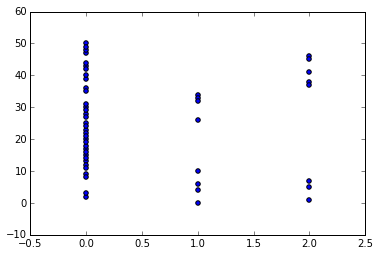

In [6]:
# Get the frame idx of each frame in each cluster
cluster_idx = [[v[0] for v in  c['children']] for c in clusters]
y = list(vs.mit.flatten(cluster_idx))
x = list(vs.mit.flatten([(vs.it.repeat(i, len(clusters[i]['children']))) for i in range(0, len(clusters))]))
plt.scatter(x, y)

/usr/local/lib/python2.7/site-packages/matplotlib/axes/_subplots.py:69: MatplotlibDeprecationWarning: The use of 0 (which ends up being the _last_ sub-plot) is deprecated in 1.4 and will raise an error in 1.5
  mplDeprecation)


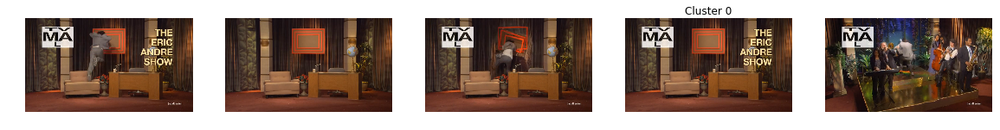

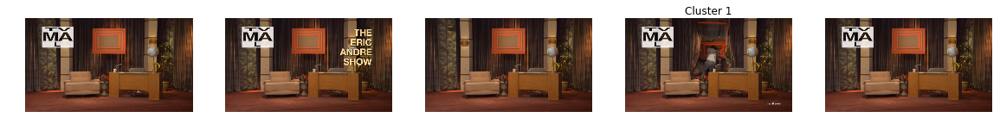

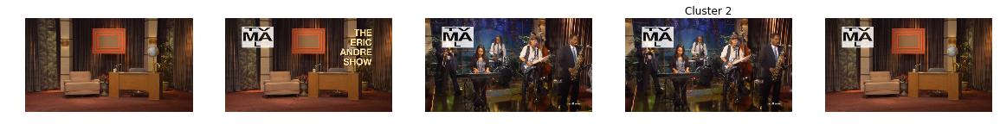

In [7]:
for i,c in enumerate(clusters):
    plt.figure(figsize=(20,5))
    for j,v in enumerate(c['children'][0:5]):
        plt.subplot(1,5,j)
        plt.axis('off')
        plt.imshow(vs.cv2.cvtColor(frames_mini[int(v[0])], vs.cv2.COLOR_BGR2RGB))
    plt.title('Cluster {}'.format(i))

# Full Video (5fps)

In [8]:
frames = list(vs.frames_from_file('eric-5fps.mp4'))

In [9]:
prev_num_frames = 10
prev_idx = list(vs.it.takewhile(lambda i: i < len(frames), vs.it.count(0, len(frames)/prev_num_frames)))

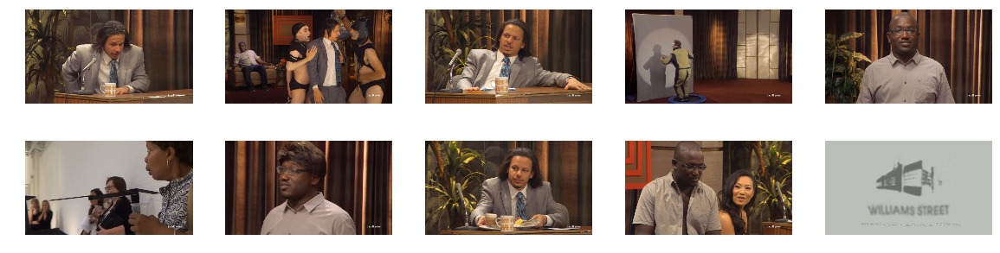

In [10]:
plt.figure(figsize=(20,5))
for i in range(1, 11):
    plt.subplot(2, 5, i)
    plt.axis('off')
    plt.imshow(vs.cv2.cvtColor(frames[prev_idx[i]], vs.cv2.COLOR_BGR2RGB))

In [11]:
A = vs.frames_to_matrix(frames, 5, 3, 3)
V, S, rank = vs.frame_decomp(A)
clusters = vs.cluster(V, S, rank, 50)

Cluster count: 1
Unclustered V: 1686
Cluster count: 2
Unclustered V: 1136
Cluster count: 3
Unclustered V: 1085
Cluster count: 4
Unclustered V: 1016
Cluster count: 5
Unclustered V: 932
Cluster count: 6
Unclustered V: 913
Cluster count: 7
Unclustered V: 894
Cluster count: 8
Unclustered V: 879
Cluster count: 9
Unclustered V: 771
Cluster count: 10
Unclustered V: 725
Cluster count: 11
Unclustered V: 708
Cluster count: 12
Unclustered V: 664
Cluster count: 13
Unclustered V: 173
Cluster count: 14
Unclustered V: 171
Cluster count: 15
Unclustered V: 164
Cluster count: 16
Unclustered V: 118
Cluster count: 17
Unclustered V: 44
Cluster count: 18
Unclustered V: 35
Cluster count: 19
Unclustered V: 19
Cluster count: 20
Unclustered V: 16
Cluster count: 21
Unclustered V: 12
Cluster count: 22
Unclustered V: 5
Cluster count: 23
Unclustered V: 1
Cluster count: 24
Unclustered V: 0


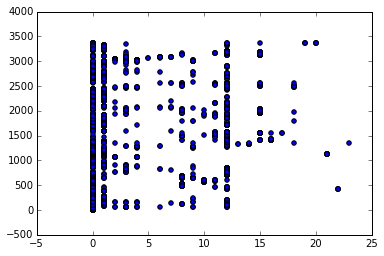

In [12]:
# Get the frame idx of each frame in each cluster
cluster_idx = [[v[0] for v in  c['children']] for c in clusters]
y = list(vs.mit.flatten(cluster_idx))
x = list(vs.mit.flatten([(vs.it.repeat(i, len(clusters[i]['children']))) for i in range(0, len(clusters))]))
plt.scatter(x, y)

/usr/local/lib/python2.7/site-packages/matplotlib/pyplot.py:424: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


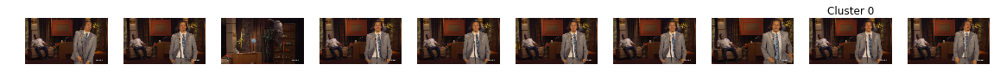

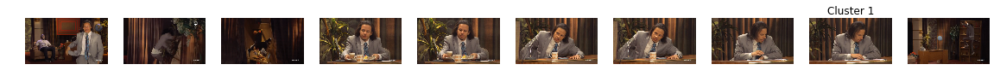

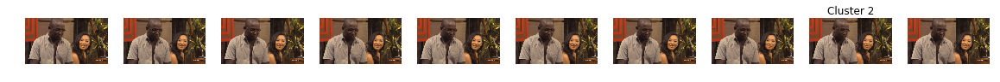

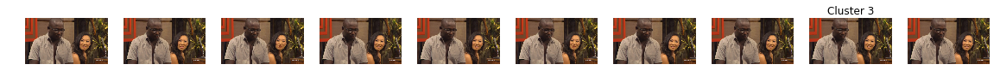

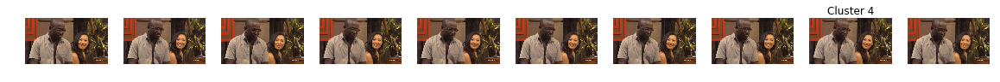

...

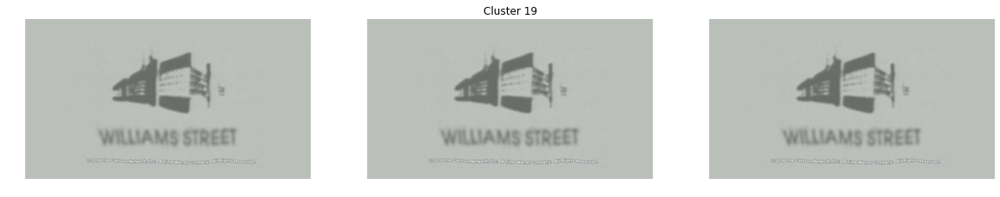

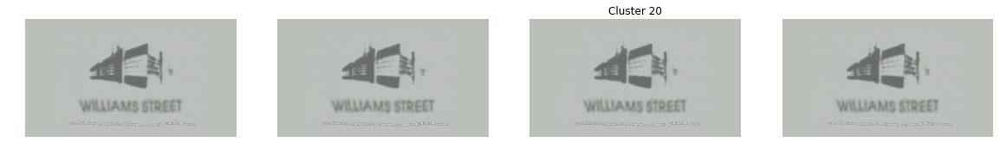

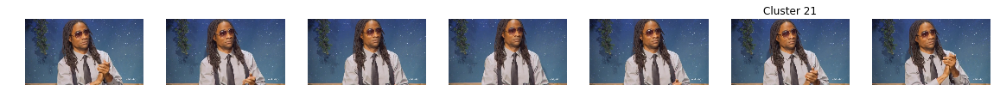

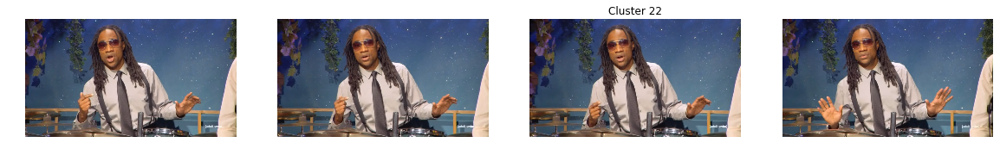

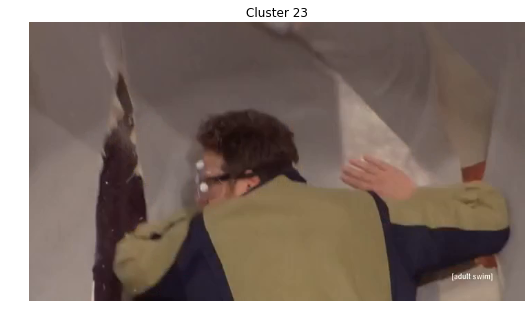

In [13]:
for i,c in enumerate(clusters):
    plt.figure(figsize=(20,5))
    c_len = len(c['children'])
    for j,v in enumerate(c['children'][0:10]):
        plt.subplot(1,len(c['children'][0:10]),j)
        plt.axis('off')
        plt.imshow(vs.cv2.cvtColor(frames[int(v[0])], vs.cv2.COLOR_BGR2RGB))
    plt.title('Cluster {}'.format(i))

In [21]:
joblib.dump(clusters, 'clusters/eric-clusters.pkl');

In [22]:
clusters_loaded = joblib.load('clusters/eric-clusters.pkl') 

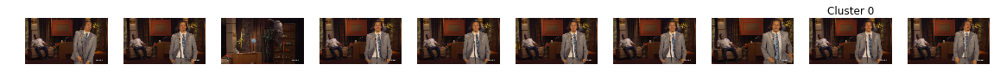

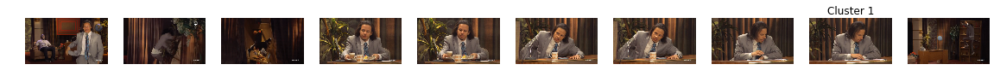

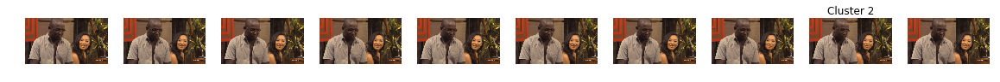

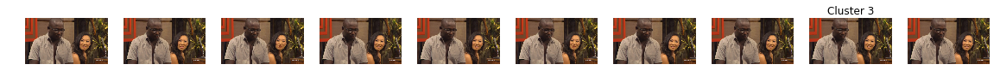

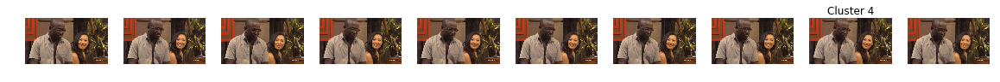

...

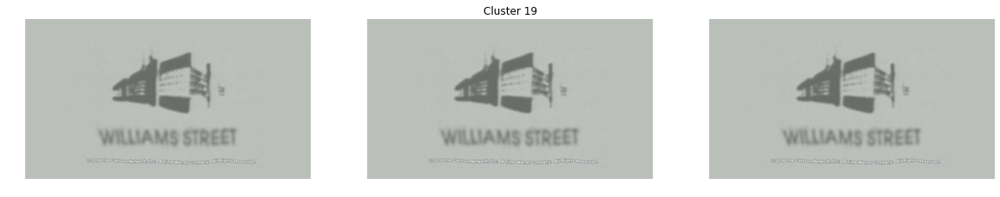

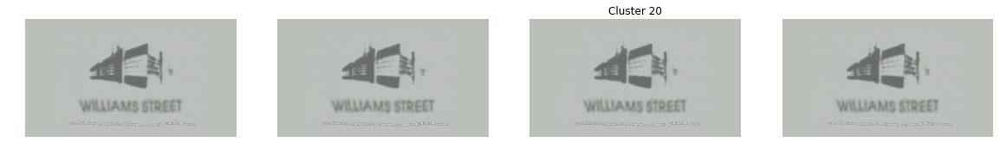

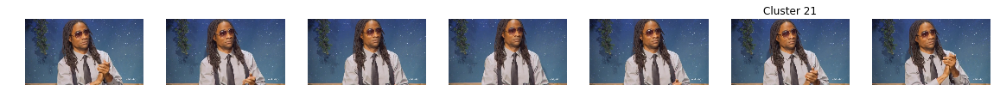

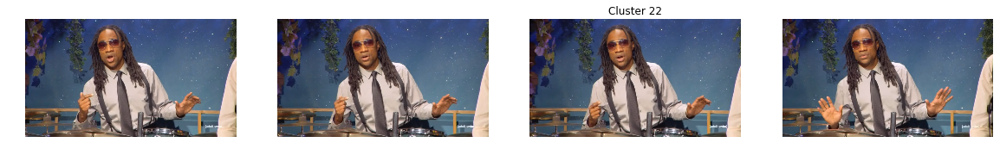

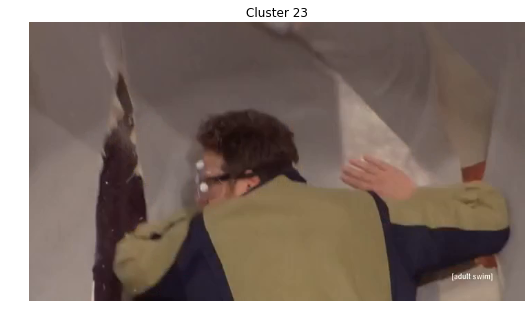

In [23]:
for i,c in enumerate(clusters_loaded):
    plt.figure(figsize=(20,5))
    c_len = len(c['children'])
    for j,v in enumerate(c['children'][0:10]):
        plt.subplot(1,len(c['children'][0:10]),j)
        plt.axis('off')
        plt.imshow(vs.cv2.cvtColor(frames[int(v[0])], vs.cv2.COLOR_BGR2RGB))
    plt.title('Cluster {}'.format(i))